In [1]:
%matplotlib inline

In [2]:
import sys
sys.path.insert(0,'..')
import pickle

import visualize
import datasets
import ldle
# Uncomment to reload a library
from importlib import reload 
visualize = reload(visualize)
ldle = reload(ldle)
datasets = reload(datasets)

matplotlib.get_backend() =  module://ipykernel.pylab.backend_inline
matplotlib.get_backend() =  module://ipykernel.pylab.backend_inline


# Noise = 0.01

In [3]:
noise = 0.01

In [4]:
save_dir_root = '../data/ldle1/noisyswissroll_'+str(noise)+'/'

In [5]:
X, labelsMat, ddX = datasets.Datasets().noisyswissroll(noise=noise)

X.shape =  (10260, 3)


# LDLE

In [6]:
ldle_obj = ldle.LDLE(X=X, eta_min=5, max_iter0=20,
                     vis = visualize.Visualize(save_dir_root),
                     vis_y_options = {'cmap0':'summer', # for the interior
                                      'cmap1':'jet', # for the tear
                                      'labels':labelsMat[:,0]})

Using LDLE_1
A_k, Atilde_k: 0 points processed...
A_k, Atilde_k: 2565 points processed...
A_k, Atilde_k: 5130 points processed...
A_k, Atilde_k: 7695 points processed...
Atilde_k, Atilde_k: all points processed...

Constructing low distortion local views using LDLE...
local_param: 0 points processed...
local_param: 2565 points processed...
local_param: 5130 points processed...
local_param: 7695 points processed...
local_param: all 10260 points processed...
After iter 1, max distortion is 84.601744
After iter 2, max distortion is 77.069572
After iter 3, max distortion is 63.981838
After iter 4, max distortion is 63.981838
After iter 5, max distortion is 63.981838
After iter 6, max distortion is 63.981838
After iter 7, max distortion is 63.981838
After iter 8, max distortion is 63.981838
After iter 9, max distortion is 63.981838
Max local distortion = 63.981837926247714
###############
Took 96.7 seconds to perform step 1: construct low distoriton local views
###############

Clustering t

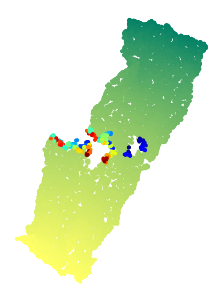

###############
Took 34.9 seconds to compute initial global embedding.
###############

Refining parameters and computing final global embedding...
Using GPA...
Iteration: 0
error: 0.001938703276395803


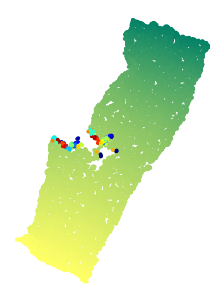

Iteration: 1
error: 0.0018044012569230082
Iteration: 2
error: 0.0017529658148139008
Iteration: 3
error: 0.0017016104770552886
Iteration: 4
error: 0.0016617555011944746
Iteration: 5
error: 0.0016363848487501598


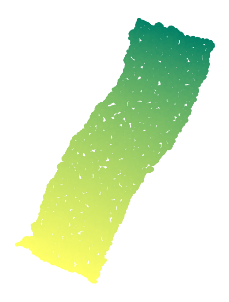

Iteration: 6
error: 0.0016191756326551438
Iteration: 7
error: 0.0015716888626722612
Iteration: 8
error: 0.0015520182984530338
Iteration: 9
error: 0.0015433433779689697
Iteration: 10
error: 0.0015383027475248713


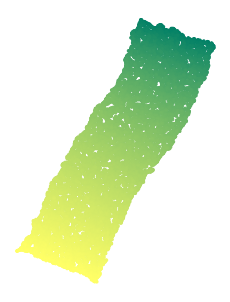

Iteration: 11
error: 0.0015351292401239033
Iteration: 12
error: 0.0015330533343548888
Iteration: 13
error: 0.0015315331246742974
Iteration: 14
error: 0.001530513309909757
Iteration: 15
error: 0.0015298415616210083


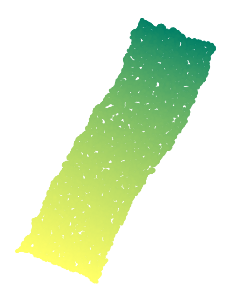

Iteration: 16
error: 0.0015294411926151947
Iteration: 17
error: 0.0015292859170365888
Iteration: 18
error: 0.0015292632524961207
Iteration: 19
error: 0.001529261851300476


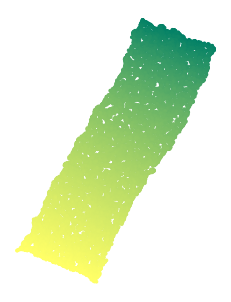

###############
Took 1012.3 seconds to refine global embedding.
###############
###############
Took 1058.7 seconds to perform step 3: compute global embedding.
###############


In [7]:
ldle_obj.fit()

# Optionally save for further visualizations using Visualization.ipynb

In [8]:
save_path = save_dir_root+'/ldle_obj.dat'
with open(save_path, "wb") as f:
    pickle.dump([X, labelsMat, ldle_obj], f)

# LTSA

In [9]:
from sklearn.manifold import LocallyLinearEmbedding
import visualize
vis = visualize.Visualize(save_dir_root)

/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 5 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 70 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


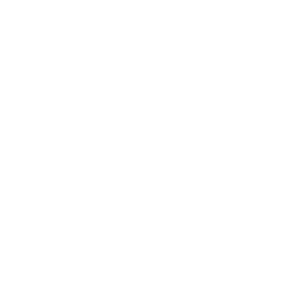

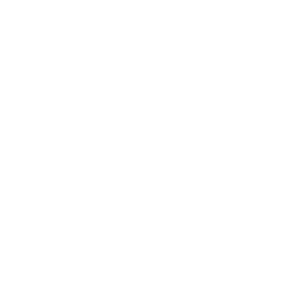

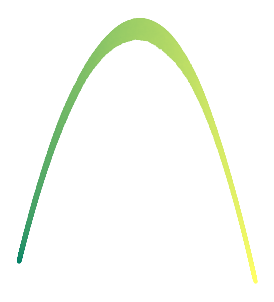

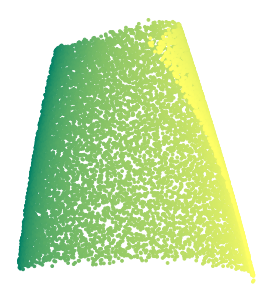

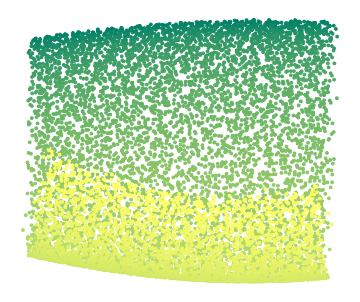

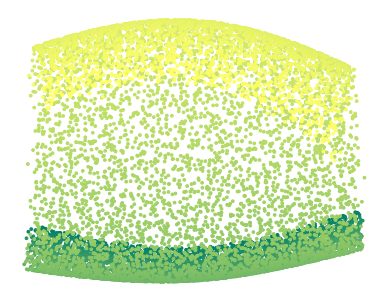

In [10]:
for n_neighbors in [5,10,25,50,75,100]:
    ltsa_obj = LocallyLinearEmbedding(method='ltsa', n_neighbors=n_neighbors,
                                      n_components=2, n_jobs=-1, random_state=42)
    y_ltsa = ltsa_obj.fit_transform(X)
    vis.global_embedding(y_ltsa, labelsMat[:,0], 'summer', title='LTSA_'+str(n_neighbors))

# UMAP

In [11]:
from umap import UMAP
import visualize
vis = visualize.Visualize(save_dir_root)

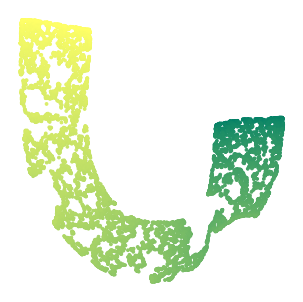

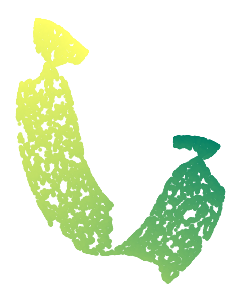

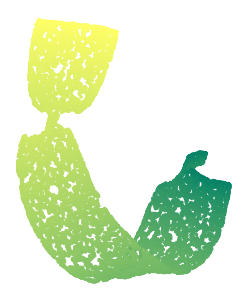

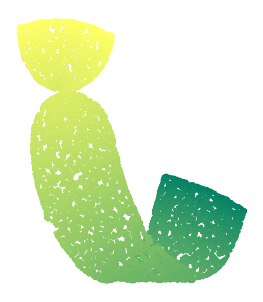

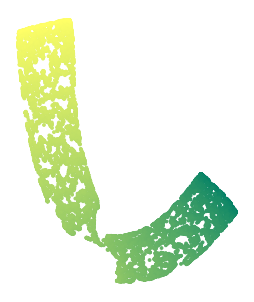

...

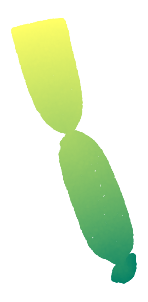

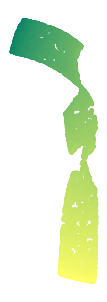

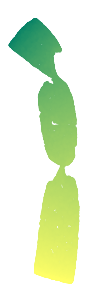

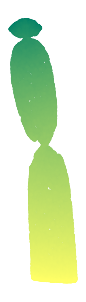

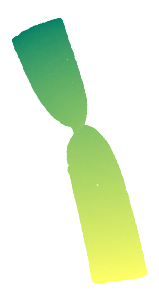

In [12]:
for n_neighbors in [25,50,100,200]:
    for min_dist in [0.01,0.1,0.25,0.5]:
        umap_obj = UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2,
                        random_state=42, n_epochs=500, metric='euclidean')
        y_umap = umap_obj.fit_transform(X)
        vis.global_embedding(y_umap, labelsMat[:,0], 'summer', title='UMAP_'+str(n_neighbors)+'_'+str(min_dist))

# t-SNE

In [13]:
from sklearn.manifold import TSNE
import visualize
vis = visualize.Visualize(save_dir_root)

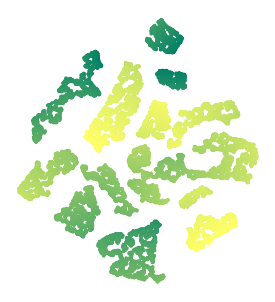

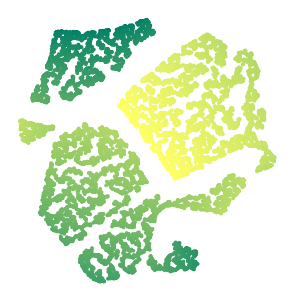

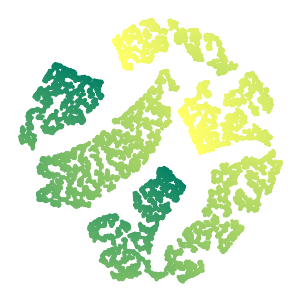

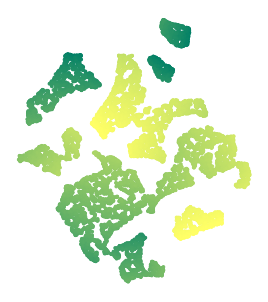

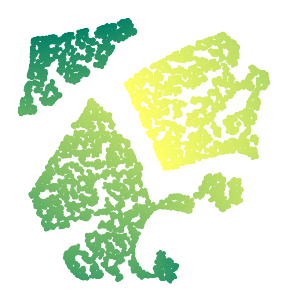

...

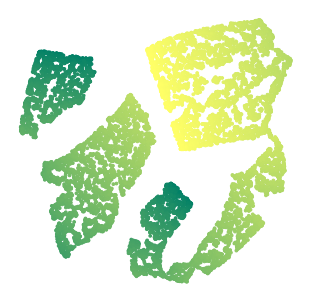

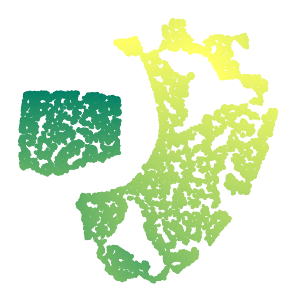

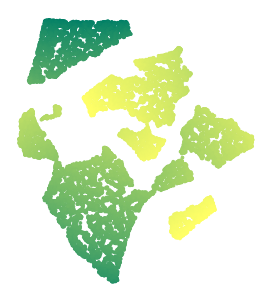

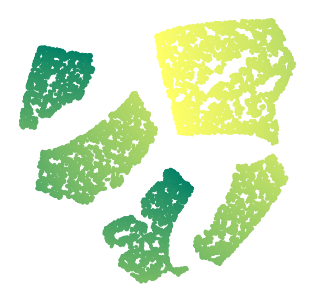

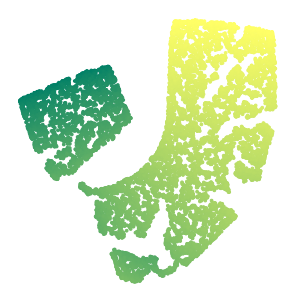

In [14]:
for perplexity in [30,40,50,60]:
    for ee in [2,4,6]:
        tsne_obj = TSNE(perplexity=perplexity, early_exaggeration=ee, n_components=2,
                        metric='euclidean', random_state=42, n_iter=1000,
                        n_jobs=-1, init='random')
        y_tsne = tsne_obj.fit_transform(X)
        vis.global_embedding(y_tsne, labelsMat[:,0], 'summer', title='t-SNE_'+str(perplexity)+'_'+str(ee))

# Noise = 0.015

In [15]:
noise = 0.015

In [16]:
save_dir_root = '../data/ldle1/noisyswissroll_'+str(noise)+'/'

In [17]:
X, labelsMat, ddX = datasets.Datasets().noisyswissroll(noise=noise)

X.shape =  (10260, 3)


# LDLE

In [18]:
ldle_obj = ldle.LDLE(X=X, eta_min=15, max_iter0=25,
                     vis = visualize.Visualize(save_dir_root),
                     vis_y_options = {'cmap0':'summer', # for the interior
                                      'cmap1':'jet', # for the tear
                                      'labels':labelsMat[:,0]})

Using LDLE_1
A_k, Atilde_k: 0 points processed...
A_k, Atilde_k: 2565 points processed...
A_k, Atilde_k: 5130 points processed...
A_k, Atilde_k: 7695 points processed...
Atilde_k, Atilde_k: all points processed...

Constructing low distortion local views using LDLE...
local_param: 0 points processed...
local_param: 2565 points processed...
local_param: 5130 points processed...
local_param: 7695 points processed...
local_param: all 10260 points processed...
After iter 1, max distortion is 105.951295
After iter 2, max distortion is 95.285776
After iter 3, max distortion is 93.494113
After iter 4, max distortion is 93.494113
After iter 5, max distortion is 93.494113
After iter 6, max distortion is 93.494113
After iter 7, max distortion is 93.494113
After iter 8, max distortion is 93.494113
After iter 9, max distortion is 93.494113
After iter 10, max distortion is 93.494113
Max local distortion = 93.49411298280255
###############
Took 53.0 seconds to perform step 1: construct low distorito

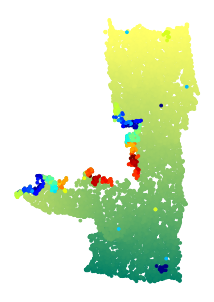

###############
Took 5.8 seconds to compute initial global embedding.
###############

Refining parameters and computing final global embedding...
Using GPA...
Iteration: 0
error: 0.0012706702253271716


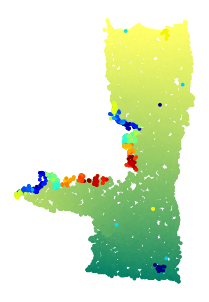

Iteration: 1
error: 0.0012552547997661011
Iteration: 2
error: 0.0012558822331216412
Iteration: 3
error: 0.001262619861088815
Iteration: 4
error: 0.0012731473884711204
Iteration: 5
error: 0.0012796958984235532


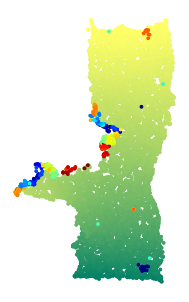

Iteration: 6
error: 0.00129009960687717
Iteration: 7
error: 0.0012961379487887597
Iteration: 8
error: 0.0013027397420321849
Iteration: 9
error: 0.0013130464339763225
Iteration: 10
error: 0.0013105825007559717


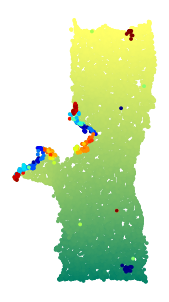

Iteration: 11
error: 0.001311069763381776
Iteration: 12
error: 0.0013060777068503616
Iteration: 13
error: 0.0012876131816829885
Iteration: 14
error: 0.0012448347906140003
Iteration: 15
error: 0.001208716426576551


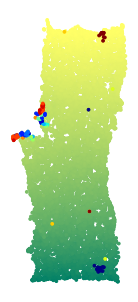

Iteration: 16
error: 0.0011256204654595723
Iteration: 17
error: 0.0010808162436171467
Iteration: 18
error: 0.0010716222135395104
Iteration: 19
error: 0.001067733303223309
Iteration: 20
error: 0.001065099037480461


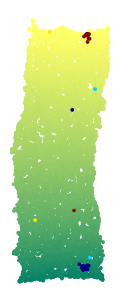

Iteration: 21
error: 0.0010631574033219827
Iteration: 22
error: 0.0010613433842981844
Iteration: 23
error: 0.0010600074941713613
Iteration: 24
error: 0.0010587777959463634


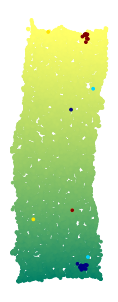

###############
Took 263.6 seconds to refine global embedding.
###############
###############
Took 270.3 seconds to perform step 3: compute global embedding.
###############


In [19]:
ldle_obj.fit()

# Optionally save for further visualizations using Visualization.ipynb

In [20]:
save_path = save_dir_root+'/ldle_obj.dat'
with open(save_path, "wb") as f:
    pickle.dump([X, labelsMat, ldle_obj], f)

# LTSA

In [21]:
from sklearn.manifold import LocallyLinearEmbedding
import visualize
vis = visualize.Visualize(save_dir_root)

/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 5 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 45 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/Users/dhkohli/opt/anaconda3/li

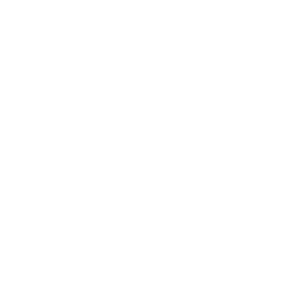

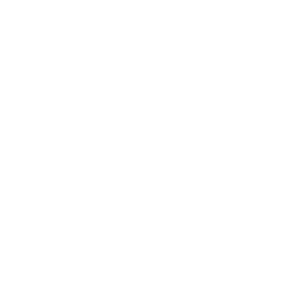

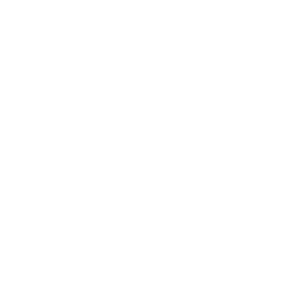

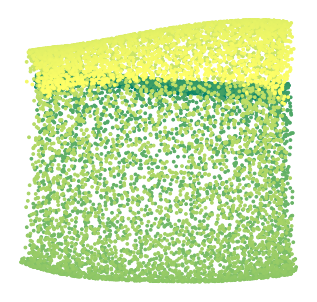

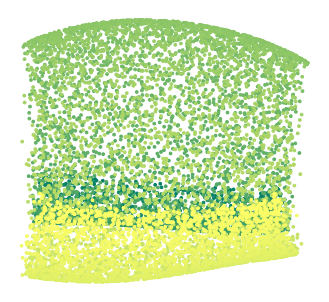

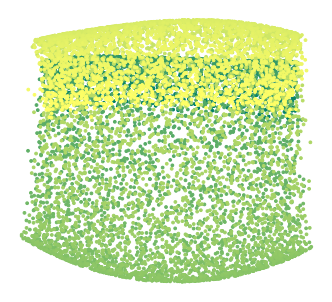

In [22]:
for n_neighbors in [5,10,25,50,75,100]:
    ltsa_obj = LocallyLinearEmbedding(method='ltsa', n_neighbors=n_neighbors,
                                      n_components=2, n_jobs=-1, random_state=42)
    y_ltsa = ltsa_obj.fit_transform(X)
    vis.global_embedding(y_ltsa, labelsMat[:,0], 'summer', title='LTSA_'+str(n_neighbors))

# UMAP

In [23]:
from umap import UMAP
import visualize
vis = visualize.Visualize(save_dir_root)

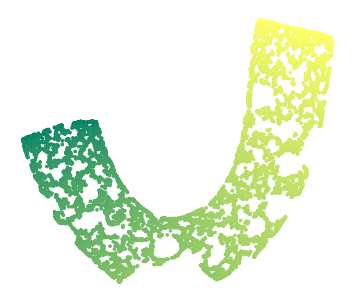

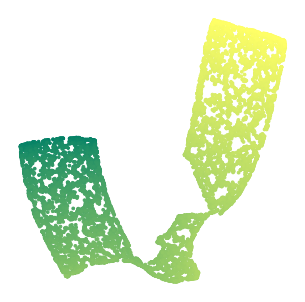

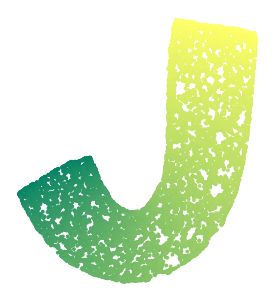

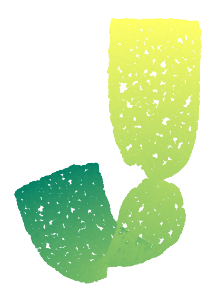

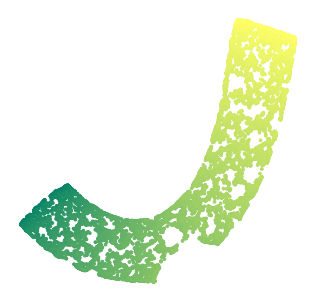

...

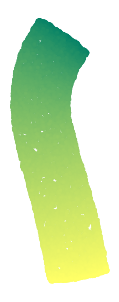

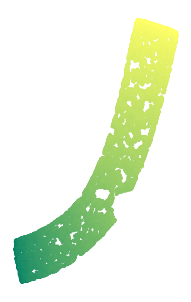

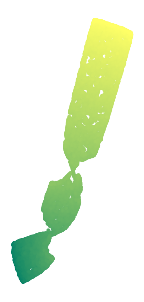

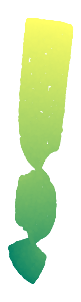

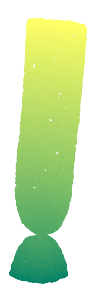

In [24]:
for n_neighbors in [25,50,100,200]:
    for min_dist in [0.01,0.1,0.25,0.5]:
        umap_obj = UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2,
                        random_state=42, n_epochs=500, metric='euclidean')
        y_umap = umap_obj.fit_transform(X)
        vis.global_embedding(y_umap, labelsMat[:,0], 'summer', title='UMAP_'+str(n_neighbors)+'_'+str(min_dist))

# t-SNE

In [25]:
from sklearn.manifold import TSNE
import visualize
vis = visualize.Visualize(save_dir_root)

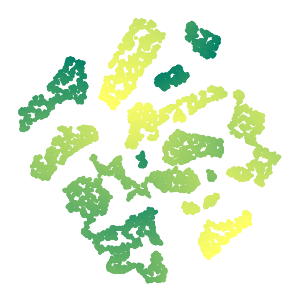

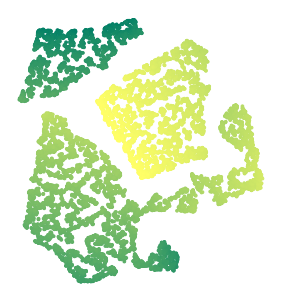

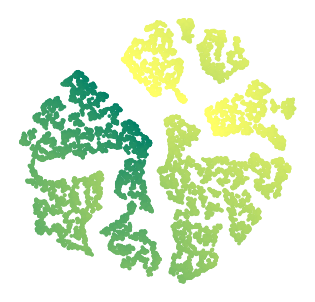

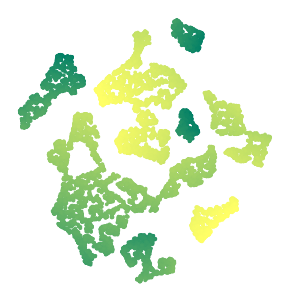

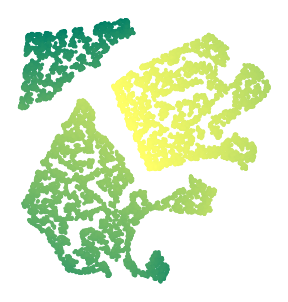

...

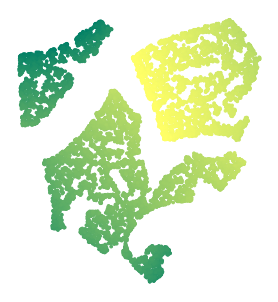

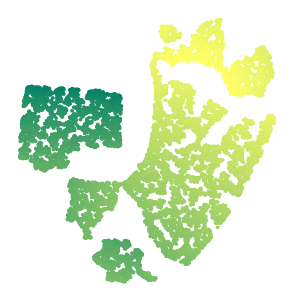

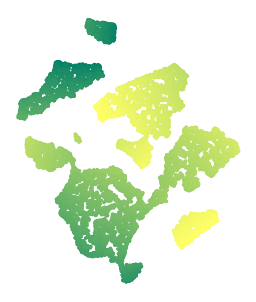

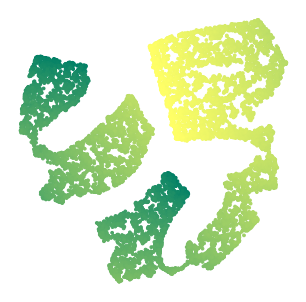

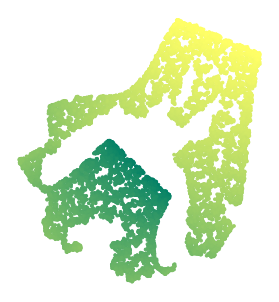

In [26]:
for perplexity in [30,40,50,60]:
    for ee in [2,4,6]:
        tsne_obj = TSNE(perplexity=perplexity, early_exaggeration=ee, n_components=2,
                        metric='euclidean', random_state=42, n_iter=1000,
                        n_jobs=-1, init='random')
        y_tsne = tsne_obj.fit_transform(X)
        vis.global_embedding(y_tsne, labelsMat[:,0], 'summer', title='t-SNE_'+str(perplexity)+'_'+str(ee))

# Noise = 0.02

In [27]:
noise = 0.02

In [28]:
save_dir_root = '../data/ldle1/noisyswissroll_'+str(noise)+'/'

In [29]:
X, labelsMat, ddX = datasets.Datasets().noisyswissroll(noise=noise)

X.shape =  (10260, 3)


# LDLE

In [30]:
ldle_obj = ldle.LDLE(X=X, eta_min=10, max_iter0=30,
                     vis = visualize.Visualize(save_dir_root),
                     vis_y_options = {'cmap0':'summer', # for the interior
                                      'cmap1':'jet', # for the tear
                                      'labels':labelsMat[:,0]})

Using LDLE_1
A_k, Atilde_k: 0 points processed...
A_k, Atilde_k: 2565 points processed...
A_k, Atilde_k: 5130 points processed...
A_k, Atilde_k: 7695 points processed...
Atilde_k, Atilde_k: all points processed...

Constructing low distortion local views using LDLE...
local_param: 0 points processed...
local_param: 2565 points processed...
local_param: 5130 points processed...
local_param: 7695 points processed...
local_param: all 10260 points processed...
After iter 1, max distortion is 59.121854
After iter 2, max distortion is 49.605590
After iter 3, max distortion is 44.768647
After iter 4, max distortion is 44.768647
After iter 5, max distortion is 44.768647
After iter 6, max distortion is 44.768647
After iter 7, max distortion is 44.768647
After iter 8, max distortion is 44.768647
Max local distortion = 44.76864692146014
###############
Took 51.5 seconds to perform step 1: construct low distoriton local views
###############

Clustering to obtain low distortion intermediate views.

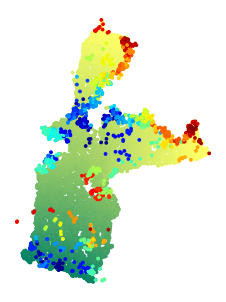

###############
Took 8.9 seconds to compute initial global embedding.
###############

Refining parameters and computing final global embedding...
Using GPA...
Iteration: 0
error: 0.001595951133568445


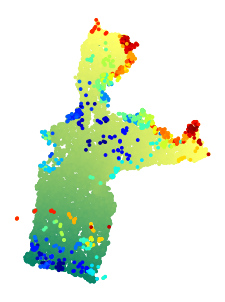

Iteration: 1
error: 0.0015669385337923425
Iteration: 2
error: 0.001564893613626284
Iteration: 3
error: 0.001567505652342746
Iteration: 4
error: 0.0015763026856071168
Iteration: 5
error: 0.0015824649284810431


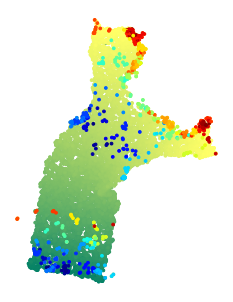

Iteration: 6
error: 0.0015718559948856721
Iteration: 7
error: 0.0015763292833963507
Iteration: 8
error: 0.0015831463685059598
Iteration: 9
error: 0.0015908487312294671
Iteration: 10
error: 0.0015969916553189394


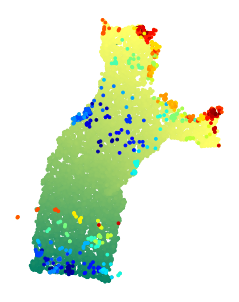

Iteration: 11
error: 0.0016011854979928175
Iteration: 12
error: 0.0016085386218881673
Iteration: 13
error: 0.0016095526087942355
Iteration: 14
error: 0.0016091506945613736
Iteration: 15
error: 0.0016078412354087644


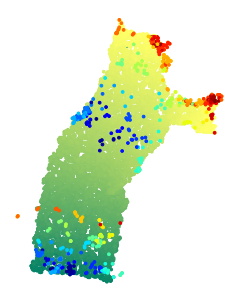

Iteration: 16
error: 0.0016088237692404683
Iteration: 17
error: 0.001607898522284032
Iteration: 18
error: 0.0016079947329504182
Iteration: 19
error: 0.0016084982725461587
Iteration: 20
error: 0.001612751107881923


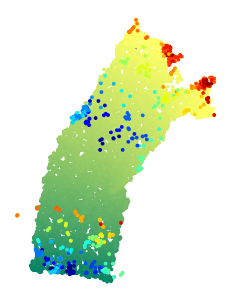

Iteration: 21
error: 0.0016127122593932984
Iteration: 22
error: 0.001583645828676104
Iteration: 23
error: 0.0015561285341374074
Iteration: 24
error: 0.001544750276419408
Iteration: 25
error: 0.0015393338006049963


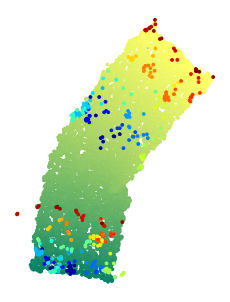

Iteration: 26
error: 0.0015353835014394032
Iteration: 27
error: 0.001532526921929082
Iteration: 28
error: 0.0015300875967129675
Iteration: 29
error: 0.001528038259043122


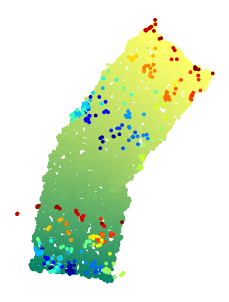

###############
Took 581.0 seconds to refine global embedding.
###############
###############
Took 591.7 seconds to perform step 3: compute global embedding.
###############


In [31]:
ldle_obj.fit()

# Optionally save for further visualizations using Visualization.ipynb

In [32]:
save_path = save_dir_root+'/ldle_obj.dat'
with open(save_path, "wb") as f:
    pickle.dump([X, labelsMat, ldle_obj], f)

# LTSA

In [33]:
from sklearn.manifold import LocallyLinearEmbedding
import visualize
vis = visualize.Visualize(save_dir_root)

/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 38 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 45 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/Users/dhkohli/opt/anaconda3/l

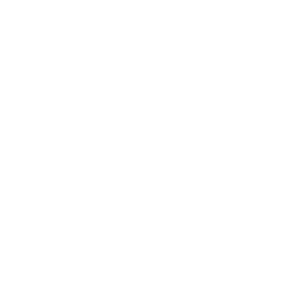

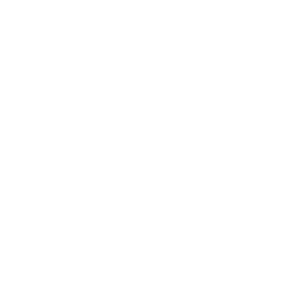

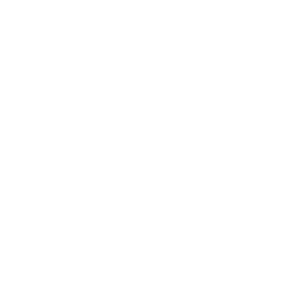

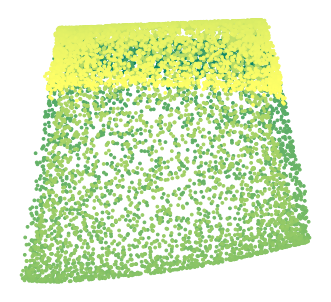

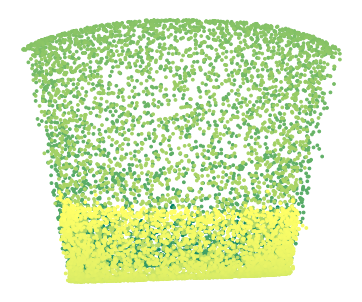

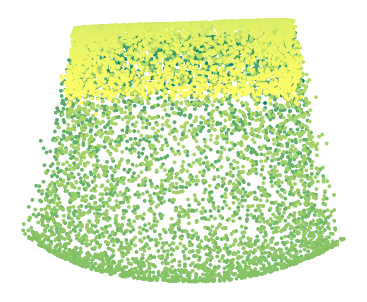

In [34]:
for n_neighbors in [5,10,25,50,75,100]:
    ltsa_obj = LocallyLinearEmbedding(method='ltsa', n_neighbors=n_neighbors,
                                      n_components=2, n_jobs=-1, random_state=42)
    y_ltsa = ltsa_obj.fit_transform(X)
    vis.global_embedding(y_ltsa, labelsMat[:,0], 'summer', title='LTSA_'+str(n_neighbors))

# UMAP

In [35]:
from umap import UMAP
import visualize
vis = visualize.Visualize(save_dir_root)

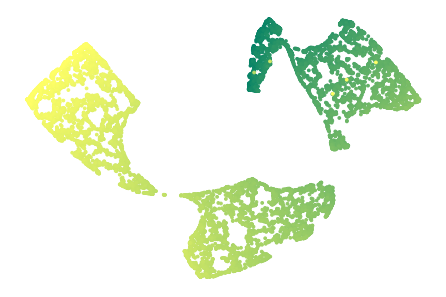

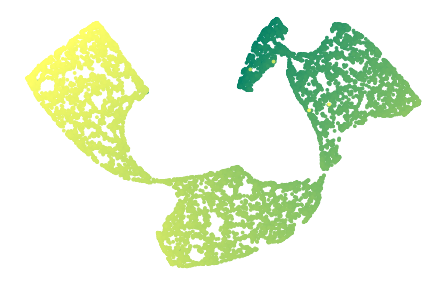

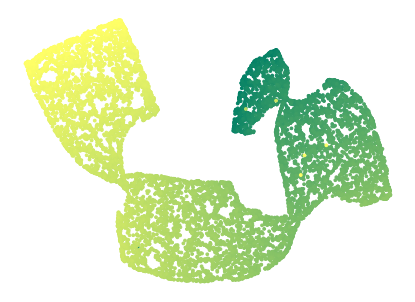

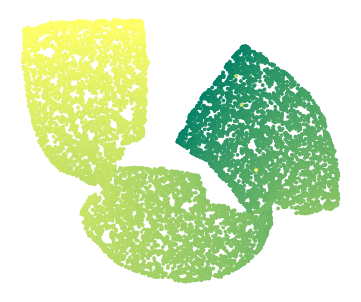

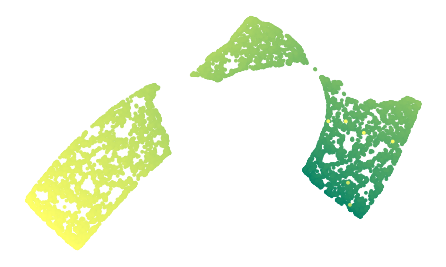

...

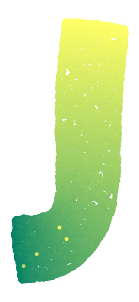

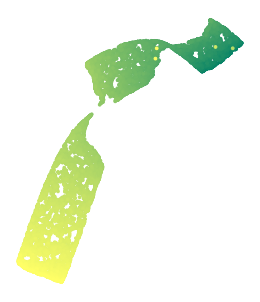

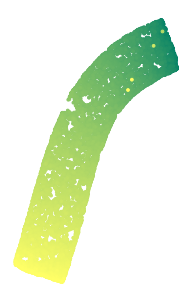

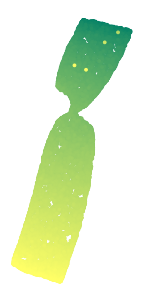

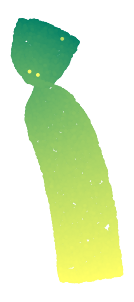

In [36]:
for n_neighbors in [25,50,100,200]:
    for min_dist in [0.01,0.1,0.25,0.5]:
        umap_obj = UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2,
                        random_state=42, n_epochs=500, metric='euclidean')
        y_umap = umap_obj.fit_transform(X)
        vis.global_embedding(y_umap, labelsMat[:,0], 'summer', title='UMAP_'+str(n_neighbors)+'_'+str(min_dist))

# t-SNE

In [37]:
from sklearn.manifold import TSNE
import visualize
vis = visualize.Visualize(save_dir_root)

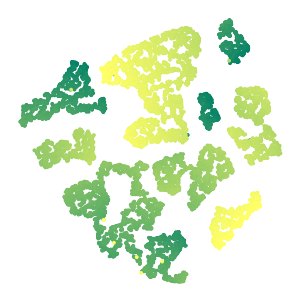

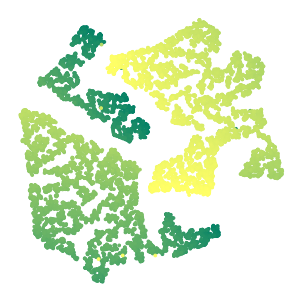

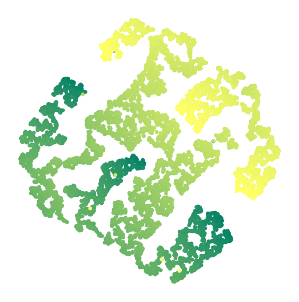

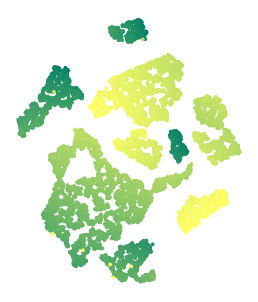

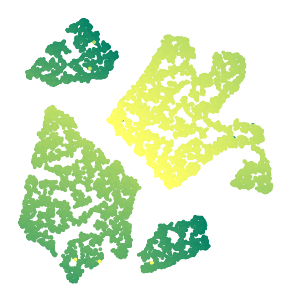

...

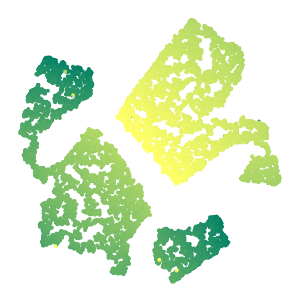

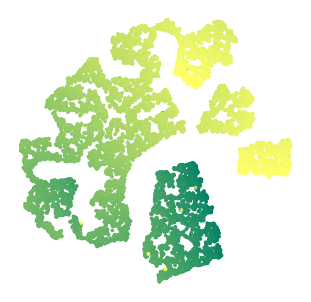

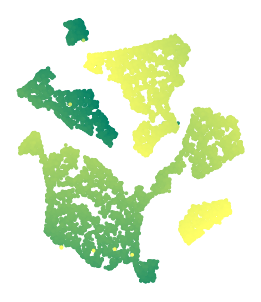

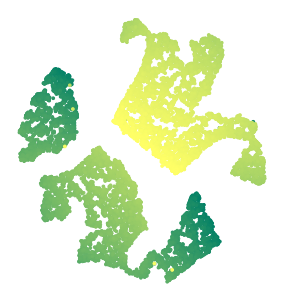

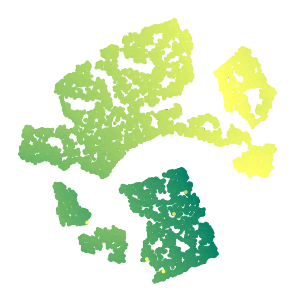

In [38]:
for perplexity in [30,40,50,60]:
    for ee in [2,4,6]:
        tsne_obj = TSNE(perplexity=perplexity, early_exaggeration=ee, n_components=2,
                        metric='euclidean', random_state=42, n_iter=1000,
                        n_jobs=-1, init='random')
        y_tsne = tsne_obj.fit_transform(X)
        vis.global_embedding(y_tsne, labelsMat[:,0], 'summer', title='t-SNE_'+str(perplexity)+'_'+str(ee))

# Noise = 0.025

In [39]:
noise = 0.025

In [40]:
save_dir_root = '../data/ldle1/noisyswissroll_'+str(noise)+'/'

In [41]:
X, labelsMat, ddX = datasets.Datasets().noisyswissroll(noise=noise)

X.shape =  (10260, 3)


# LDLE

In [42]:
ldle_obj = ldle.LDLE(X=X, eta_min=5, k=12, N=25, tau=5, delta=0.25, # encourage selection of low freq eigvecs
                     k_tune=16,  max_iter0=5, 
                     vis = visualize.Visualize(save_dir_root),
                     vis_y_options = {'cmap0':'summer', # for the interior
                                      'cmap1':'jet', # for the tear
                                      'labels':labelsMat[:,0]})

Using LDLE_1
A_k, Atilde_k: 0 points processed...
A_k, Atilde_k: 2565 points processed...
A_k, Atilde_k: 5130 points processed...
A_k, Atilde_k: 7695 points processed...
Atilde_k, Atilde_k: all points processed...

Constructing low distortion local views using LDLE...
local_param: 0 points processed...
local_param: 2565 points processed...
local_param: 5130 points processed...
local_param: 7695 points processed...
local_param: all 10260 points processed...
After iter 1, max distortion is 109.358522
After iter 2, max distortion is 79.943133
After iter 3, max distortion is 67.838385
After iter 4, max distortion is 67.107735
After iter 5, max distortion is 67.107735
After iter 6, max distortion is 54.666194
After iter 7, max distortion is 54.666194
After iter 8, max distortion is 54.666194
After iter 9, max distortion is 54.666194
After iter 10, max distortion is 49.277365
After iter 11, max distortion is 48.978388
After iter 12, max distortion is 48.978388
After iter 13, max distortion i

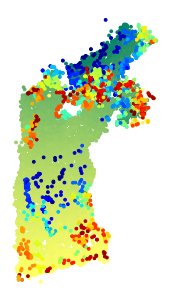

###############
Took 18.4 seconds to compute initial global embedding.
###############

Refining parameters and computing final global embedding...
Using GPA...
Iteration: 0
error: 0.00510436718626573


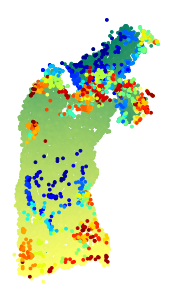

Iteration: 1
error: 0.005033384463568565
Iteration: 2
error: 0.004935218639514916
Iteration: 3
error: 0.004892887070366243
Iteration: 4
error: 0.004856756582367806


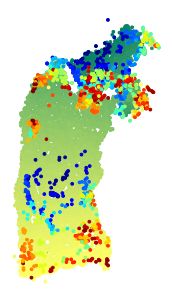

###############
Took 171.0 seconds to refine global embedding.
###############
###############
Took 195.6 seconds to perform step 3: compute global embedding.
###############


In [43]:
%matplotlib inline
ldle_obj.fit()

# Optionally save for further visualizations using Visualization.ipynb

In [44]:
save_path = save_dir_root+'/ldle_obj.dat'
with open(save_path, "wb") as f:
    pickle.dump([X, labelsMat, ldle_obj], f)

# LTSA

In [45]:
from sklearn.manifold import LocallyLinearEmbedding
import visualize
vis = visualize.Visualize(save_dir_root)

/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 38 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 38 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/Users/dhkohli/opt/anaconda3/l

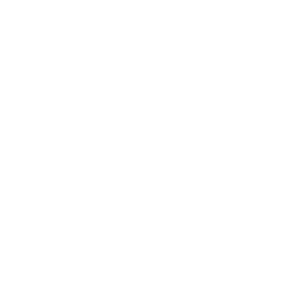

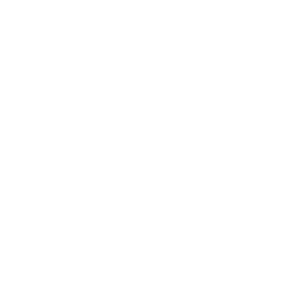

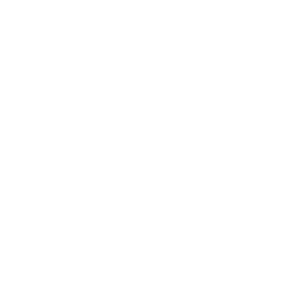

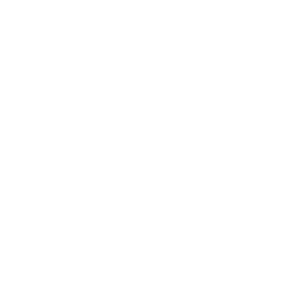

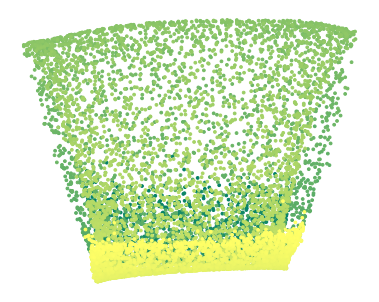

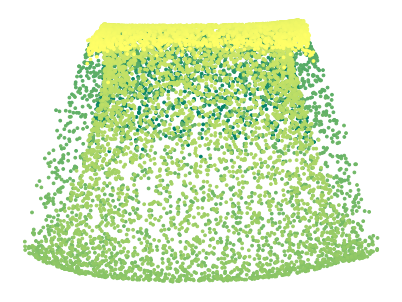

In [46]:
for n_neighbors in [5,10,25,15,75,100]:
    ltsa_obj = LocallyLinearEmbedding(method='ltsa', n_neighbors=n_neighbors,
                                      n_components=2, n_jobs=-1, random_state=42)
    y_ltsa = ltsa_obj.fit_transform(X)
    vis.global_embedding(y_ltsa, labelsMat[:,0], 'summer', title='LTSA_'+str(n_neighbors))

# UMAP

In [47]:
from umap import UMAP
import visualize
vis = visualize.Visualize(save_dir_root)

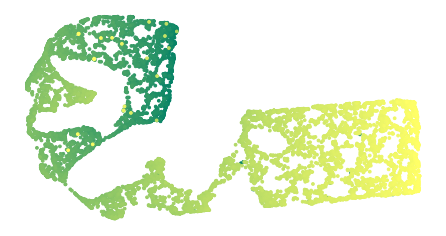

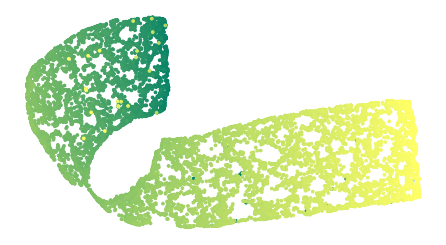

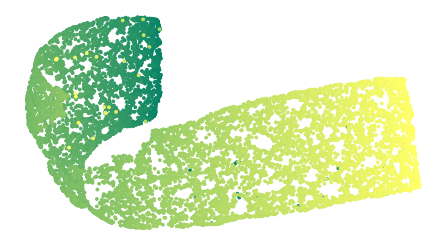

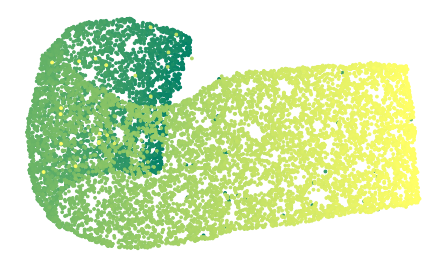

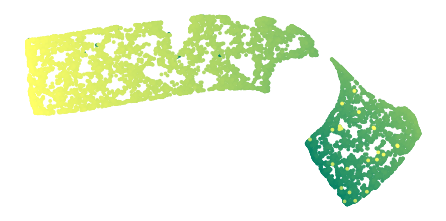

...

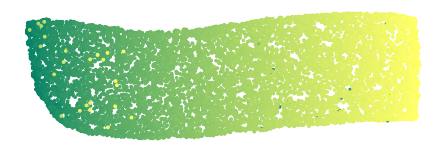

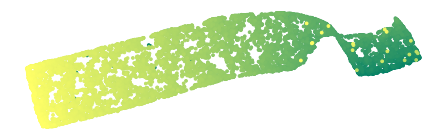

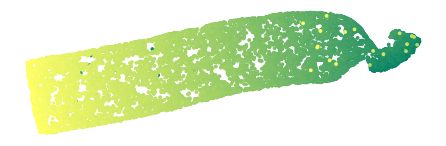

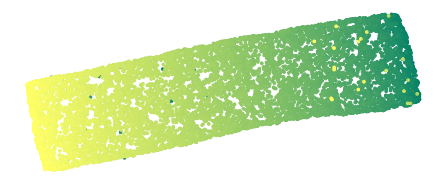

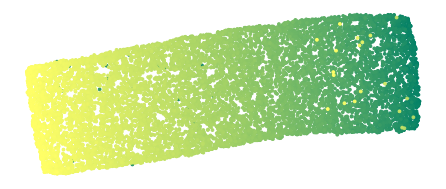

In [48]:
for n_neighbors in [25,50,100,200]:
    for min_dist in [0.01,0.1,0.25,0.5]:
        umap_obj = UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2,
                        random_state=42, n_epochs=500, metric='euclidean')
        y_umap = umap_obj.fit_transform(X)
        vis.global_embedding(y_umap, labelsMat[:,0], 'summer', title='UMAP_'+str(n_neighbors)+'_'+str(min_dist))

# t-SNE

In [49]:
from sklearn.manifold import TSNE
import visualize
vis = visualize.Visualize(save_dir_root)

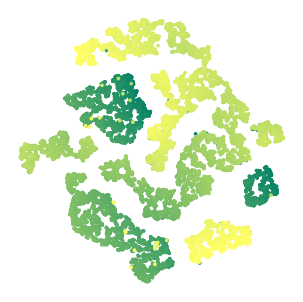

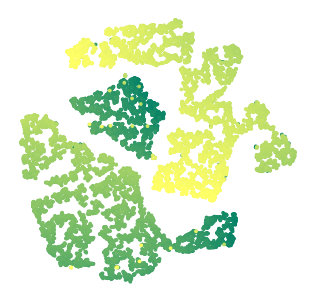

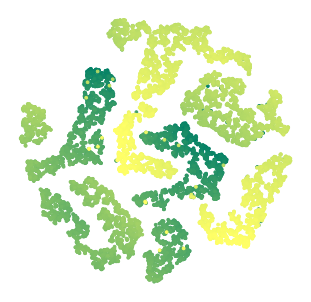

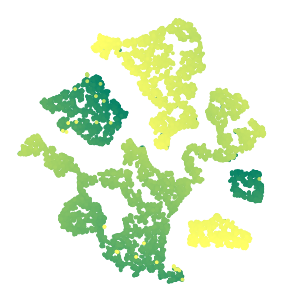

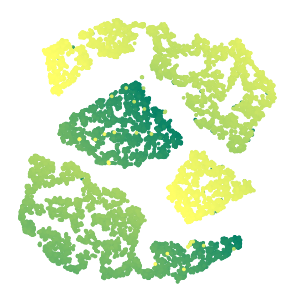

...

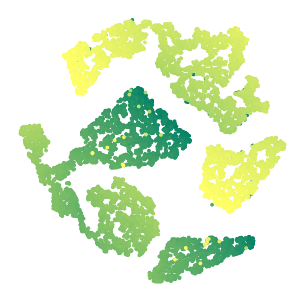

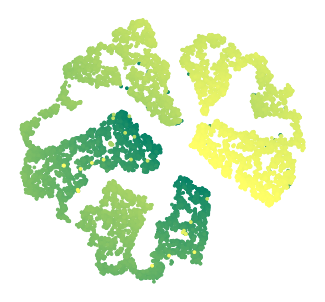

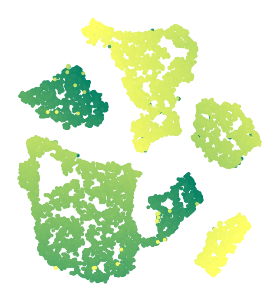

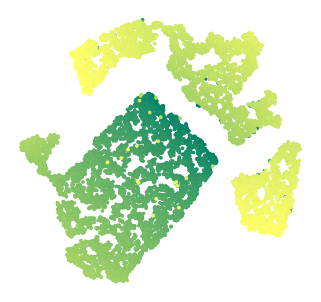

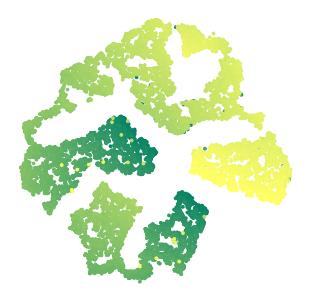

In [50]:
for perplexity in [30,40,50,60]:
    for ee in [2,4,6]:
        tsne_obj = TSNE(perplexity=perplexity, early_exaggeration=ee, n_components=2,
                        metric='euclidean', random_state=42, n_iter=1000,
                        n_jobs=-1, init='random')
        y_tsne = tsne_obj.fit_transform(X)
        vis.global_embedding(y_tsne, labelsMat[:,0], 'summer', title='t-SNE_'+str(perplexity)+'_'+str(ee))